Plot the source time function of the previous 1D case, how much is the speed of the wave?

[ Info: Saved animation to d:\OneDrive - UGM 365\Semester Gasal 2023-2024\Fisika Komputasi\elastic-wave\source_time_function-1.gif


Plots.AnimatedGif("d:\\OneDrive - UGM 365\\Semester Gasal 2023-2024\\Fisika Komputasi\\elastic-wave\\source_time_function-1.gif")
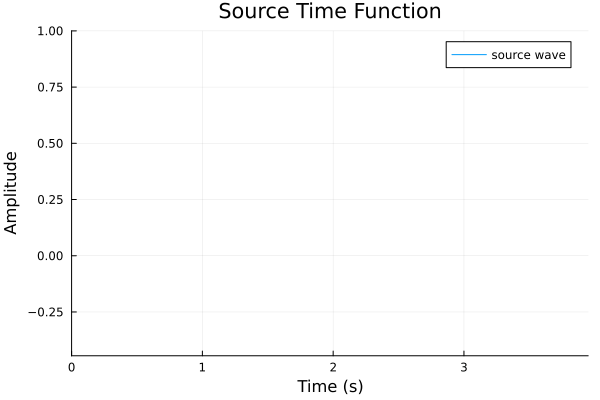

In [19]:
using Plots

# Parameters
t_max = 4.0    # Maximum simulation time (in seconds)
dt = 0.05    # Time step
nt = round(Int, t_max / dt) # Calculate the number of time steps based on t_max
f = 1.0      # central frequency of the source

# Time array
t = dt * (0:nt-1)

# Source term (simple Ricker wavelet)
function ricker_wavelet(t, f; tau=2.0)
    A = (1 - 2 * π^2 * f^2 * (t - tau)^2)
    wavelet = A * exp(-π^2 * f^2 * (t - tau)^2)
    return wavelet
end

# Compute source time function
source = ricker_wavelet.(t, f)

function plot_source_time_function(t, source, i)
    plot(t[1:i], source[1:i], title="Source Time Function", xlabel="Time (s)", ylabel="Amplitude", legend=true, label="source wave", xlims=(0, maximum(t)), ylims=(minimum(source), maximum(source)))
end

# Create animation
# @sync begin
    anim = @animate for i = 1:nt
        plot_source_time_function(t, source, i)
    end
# end

# Save animation as a gif
gif(anim, "source_time_function-1.gif", fps=15)

kecepatan c adalah akar kuadrat dari rasio modulus geser terhadap densitas massa

$$ c = \sqrt{\frac{\mu}{\rho}} $$

Optimize the computation and display on the figure

Based on the CFL (Courant-Friedrichs-Lewy) condition, the equation given by:

$$  c \frac{\Delta t}{\Delta x} \leq 1 $$

In this equation, $c$ represents the wave speed, $\Delta x$ represents the spatial step, and $\Delta t$ represents the time step. The condition states that the product of the wave speed and the ratio of the time step to the spatial step should be less than or equal to 1 to ensure numerical stability in certain numerical methods.

In [21]:
# Parameters
c = 850     # Speed of wave propagation (in m/s)
f = 1.0        # Central frequency of the source (in Hz)
λ = c / f      # Wavelength

# Adjust the spatial and temporal parameters to satisfy the CFL condition
dx = 0.01 * λ  # Spatial step size (about 1/10 of a wavelength)
dt = dx / c    # Time step size based on the CFL condition

t_max = 25.0    # Maximum simulation time (in seconds)
x_max = 5000.0    # Maximum spatial coordinate (in meters)

println("Spatial step size: $dx")
println("Time step size: $dt")

nt = round(Int, t_max / dt) # Calculate the number of time steps based on t_max
nx = round(Int, x_max / dx) # Calculate the number of spatial steps based on x_max
println("Number of time steps: $nt")
println("Number of spatial steps: $nx")

ρ = 2.5        # Density of the medium (in kg/m^3)
μ = ρ * c^2    # Shear modulus of the medium (in Pa)

u = zeros(nx)       # Displacement at current time step
u_prev = zeros(nx)  # Displacement at the previous time step
u_next = zeros(nx)  # Displacement at the next time step

u_time = zeros(nt, nx)  # Displacement at all time steps

# Source term (simple Ricker wavelet)
function ricker_wavelet(t, f; tau=2.0)
    A = (1 - 2 * π^2 * f^2 * (t - tau)^2)
    wavelet = A * exp(-π^2 * f^2 * (t - tau)^2)
    return wavelet
end

source_loc = nx ÷ 2

# Time-stepping loop
for it = 1:nt
    for ix = 2:nx-1
        u_next[ix] = 2u[ix] - u_prev[ix] + (c^2 * dt^2 / dx^2) * (u[ix+1] - 2u[ix] + u[ix-1])
    end
    u_next[source_loc] += ricker_wavelet(it * dt, f)

    u_prev, u, u_next = u, u_next, u_prev

    u_time[it, :] = u
end

Spatial step size: 8.5
Time step size: 0.01
Number of time steps: 2500
Number of spatial steps: 588


[ Info: Saved animation to d:\OneDrive - UGM 365\Semester Gasal 2023-2024\Fisika Komputasi\elastic-wave\elastic_wave-1.gif


Plots.AnimatedGif("d:\\OneDrive - UGM 365\\Semester Gasal 2023-2024\\Fisika Komputasi\\elastic-wave\\elastic_wave-1.gif")
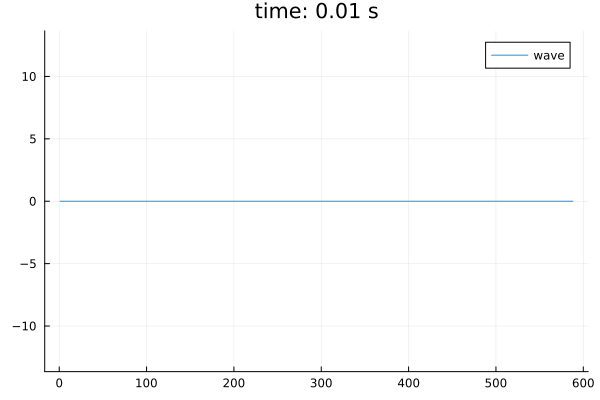

In [22]:
using Plots

max_u = maximum(u_time)
min_u = minimum(u_time)

anim = @animate for it = 1:nt
    plot(u_time[it, :], legend=true, title="time: $(it*dt) s", label="wave", ylims=(min_u, max_u))
end

gif(anim, "elastic_wave-1.gif", fps=20)

Discritize the wave equation in 2D and implement it in Julia!

In [41]:
# Parameters
c = 850     # Speed of wave propagation (in m/s)
f = 1.0     # Central frequency of the source (in Hz)
λ = c / f   # Wavelength

# Adjust the spatial and temporal parameters to satisfy the CFL condition
dx = 0.01 * λ  # Spatial step size (about 1/10 of a wavelength)
dy = dx        # Spatial step size (about 1/10 of a wavelength)
dt = dx / c    # Time step size based on the CFL condition

println("Spatial step size: $dx")
println("Time step size: $dt")

t_max = 2.5    # Maximum simulation time (in seconds)
y_max = 1000.0  # Maximum spatial coordinate (in meters)
x_max = 1000.0  # Maximum spatial coordinate (in meters)

nt = round(Int, t_max / dt) # Calculate the number of time steps based on t_max
nx = round(Int, x_max / dx) # Calculate the number of spatial steps based on x_max
ny = round(Int, y_max / dy) # Calculate the number of spatial steps based on y_max

println("Number of time steps: $nt")
println("Number of spatial steps: $nx")

ρ = 2.5        # Density of the medium (in kg/m^3)
μ = ρ * c^2    # Shear modulus of the medium (in Pa)

u = zeros(nx, ny)       # Displacement at current time step
u_prev = zeros(nx, ny)  # Displacement at the previous time step
u_next = zeros(nx, ny)  # Displacement at the next time step

u_time = zeros(nt, nx, ny)  # Displacement at all time steps

# Source term (simple Ricker wavelet)
function ricker_wavelet(t, f; tau=2.0)
    A = (1 - 2 * π^2 * f^2 * (t - tau)^2)
    wavelet = A * exp(-π^2 * f^2 * (t - tau)^2)
    return wavelet
end

source_loc_x = nx ÷ 2
source_loc_y = ny ÷ 2

# Time-stepping loop
for it = 1:nt
    for ix in 2:nx-1
        for iy in 2:ny-1
            # Calculate displacement at next time step using finite difference method
            u_next[ix, iy] = dt^2 * c^2 * ((u[ix+1, iy] - 2 * u[ix, iy] + u[ix-1, iy]) / dx^2 + (u[ix, iy+1] - 2 * u[ix, iy] + u[ix, iy-1]) / dy^2) + 2 * u[ix, iy] - u_prev[ix, iy]

            if u_next == nothing
                println("u_next is nothing")
            end
        end
    end
    u_next[source_loc_x, source_loc_y] += ricker_wavelet(it * dt, f)

    # Update displacement at each grid point
    u_prev, u, u_next = u, u_next, u_prev

    if  u == nothing
        println("u is nothing")        
    end


    u_time[it, :, :] = u
end

Spatial step size: 8.5
Time step size: 0.01
Number of time steps: 250
Number of spatial steps: 118


In [ ]:
println("u_time size: $(size(u_time))")

for it = 1:nt
    IJulia.clear_output(true)
    p = heatmap(u_time[it, :, :], title="time: $(it*dt) s", xlabel="x", ylabel="y", color=:auto, cbar=false)
    display(p)
end

In [22]:
println("Maximum displacement: $(maximum(u_time))")
println("Minimum displacement: $(minimum(u_time))")
# print(u_time[1, 100, :])

Maximum displacement: NaN
Minimum displacement: NaN


[ Info: Saved animation to d:\OneDrive - UGM 365\Semester Gasal 2023-2024\Fisika Komputasi\elastic-wave\elastic_wave-2.gif


Plots.AnimatedGif("d:\\OneDrive - UGM 365\\Semester Gasal 2023-2024\\Fisika Komputasi\\elastic-wave\\elastic_wave-2.gif")
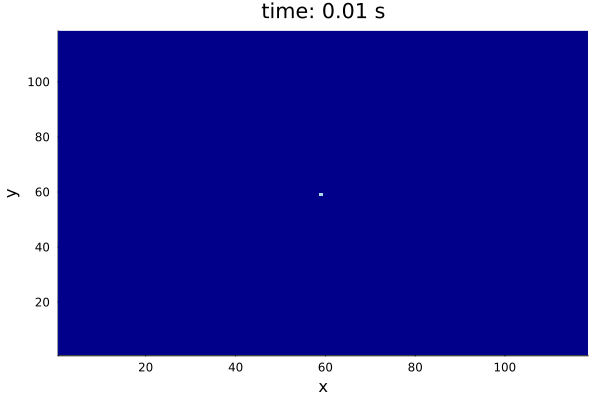

In [42]:
using Plots

# Initialize animation
anim = Animation()

for it = 1:nt
    if !any(isnothing, u_time[it, :, :])
        p = heatmap(u_time[it, :, :], color=:blues, zlim=(-1, 1), title="time: $(it*dt) s", xlabel="x", ylabel="y", cbar=false)
        frame(anim, p)
    end
end

gif(anim, "elastic_wave-2.gif", fps=20)
